# Credit Card Fraud Detection

This code was created for the purposes of scientific research in CCFD area. Short excerpts of research paper are included in this kernel for better understanding of specific parts of code. 


Due to the immense growth of e-commerce and increased online based payment possibilities, credit card fraud has become deeply relevant global issue. Recently, there has been major interest for applying machine learning algorithms as data mining technique for credit card fraud detection. However, number of challenges appear, such as lack of publicly available data, variant fraudulent behavior etc. In this work three algorithms, random forest, support vector machine and logistic regression are compared in attempt to evaluate their performance in detecting fraud on real-life data containing credit card transactions. 

Initially, all the packages used commonly throughout this exploration have to be loaded.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

#data sampling
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split

#algorithms
from sklearn.ensemble import RandomForestClassifier
from sklearn import linear_model
from sklearn.linear_model import LogisticRegression as LR
from sklearn.svm import SVC
from utils import VotingClassifierDIY
from sklearn.preprocessing import StandardScaler as SS

#evaluation
from utils import plot_confusion_matrix
from sklearn.metrics import precision_score, confusion_matrix, roc_curve, auc, roc_auc_score, average_precision_score as ap, precision_recall_curve

import random
import warnings
from sklearn.exceptions import ConvergenceWarning

%matplotlib inline

## 1. About the dataset

The dataset chosen for exploration contains transactions made in September 2013 by European cardholders, during the period of two days total. Among <b>284,807 transactions</b> there are <b>492 fraudulent</b> ones. Therefore, the dataset is <b>highly unbalanced</b>, having only 0.1727% fraudulent transactions, which are positive class.

Due to confidentiality issues, the original information about the data is omitted. 
Dataset consists of 28 numerical input variables (named V1 - V28) which are the result of transformation made by provider of the dataset and 2 additional not transformed variables - Time and Amount. Time is presented in the shape of seconds elapsed from the first recorded transaction, whereas Amount shows amount spent in a single transaction. 

In terms of supervised machine learning, all the above described variables are features. The remaining variable Class represents label which one transaction can adopt. Possible Class values are 1 if transaction is fraudulent and 0 otherwise, making this a <b>binary classification</b> problem.

The dataset is available at  https://www.kaggle.com/mlg-ulb/creditcardfraud.

#### 1.1. Exploring the dataset

First, the format of dataset is shown visually using the first few transactions. Then, existance of missing values is explored which concluded with no missing values found.


In [2]:
pd.set_option('display.max_columns', 50)

data = pd.read_csv('creditcard.csv')
data.head(5)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


&nbsp;

In [3]:
total = data.isnull().sum()
df = pd.DataFrame(data = total).T
df.rename(index={0:'Total'}, inplace=True)
df

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
Total,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [4]:
data.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,3.919560e-15,5.688174e-16,-8.769071e-15,2.782312e-15,-1.552563e-15,2.010663e-15,-1.694249e-15,-1.927028e-16,-3.137024e-15,1.768627e-15,9.170318e-16,-1.810658e-15,1.693438e-15,1.479045e-15,3.482336e-15,1.392007e-15,-7.528491e-16,4.328772e-16,9.049732e-16,5.085503e-16,1.537294e-16,7.959909e-16,5.367590e-16,4.458112e-15,1.453003e-15,1.699104e-15,-3.660161e-16,-1.206049e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,1.088850e+00,1.020713e+00,9.992014e-01,9.952742e-01,9.585956e-01,9.153160e-01,8.762529e-01,8.493371e-01,8.381762e-01,8.140405e-01,7.709250e-01,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,-2.458826e+01,-4.797473e+00,-1.868371e+01,-5.791881e+00,-1.921433e+01,-4.498945e+00,-1.412985e+01,-2.516280e+01,-9.498746e+00,-7.213527e+00,-5.449772e+01,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,-5.354257e-01,-7.624942e-01,-4.055715e-01,-6.485393e-01,-4.255740e-01,-5.828843e-01,-4.680368e-01,-4.837483e-01,-4.988498e-01,-4.562989e-01,-2.117214e-01,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,-9.291738e-02,-3.275735e-02,1.400326e-01,-1.356806e-02,5.060132e-02,4.807155e-02,6.641332e-02,-6.567575e-02,-3.636312e-03,3.734823e-03,-6.248109e-02,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,4.539234e-01,7.395934e-01,6.182380e-01,6.625050e-01,4.931498e-01,6.488208e-01,5.232963e-01,3.996750e-01,5.008067e-01,4.589494e-01,1.330408e-01,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,2.374514e+01,1.201891e+01,7.848392e+00,7.126883e+00,1.052677e+01,8.877742e+00,1.731511e+01,9.253526e+00,5.041069e+00,5.591971e+00,3.942090e+01,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


&nbsp;

## 2. Class imbalance

On the global level fraudulent transaction are amounted to less than 0.05% of the total transactions made on the annual level. This ratio is detained in the distribution of any credit card fraud dataset, resulting in highly imbalanced classes. If this problem had not been taken into consideration, any machine learning algorithm that classifies correctly only genuine transactions would perform outstanding, with accuracy level above 99%, disregarding the fact that all of the minority class transactions are classified falsely.

In [5]:
counts = data["Class"].value_counts()
trace = go.Bar(x=[0, 1], y=counts, text=counts)
                                               
plt_data = [trace]
layout = go.Layout(title="Class imbalance", xaxis={'title':'Class'}, yaxis={'title':'Number of transactions'}, width=500)
fig = go.Figure(data=plt_data,layout=layout)
iplot(fig, filename='class')

print(counts)

0    284315
1       492
Name: Class, dtype: int64


In [6]:
data_hours = data.copy()
td_seconds = pd.to_timedelta(data_hours['Time'], unit='s')
data_hours["Time_h"] = td_seconds.dt.components.hours

x0 = data_hours.loc[data_hours['Class'] == 0]["Time_h"]
x1 = data_hours.loc[data_hours['Class'] == 1]["Time_h"]

trace1 = go.Histogram(
    x=x0,
    name='Genuine',
    marker=dict(color='#191970'),
    opacity=0.75
)
trace2 = go.Histogram(
    x=x1,
    name='Fraud',
    marker=dict(color='#80aaff'),
    opacity=0.75
)
plt_data = [trace1, trace2]

layout = go.Layout(title='Transactions in time', xaxis=dict(title='Time [h]'), yaxis=dict(title='Number of transactions'))
fig = go.Figure(data=plt_data, layout=layout)
iplot(fig, filename='time')

In [7]:
trace1 = go.Histogram(
    x=x0,
    histnorm='percent', 
    name='Genuine',
    marker=dict(color='#191970'),
    opacity=0.75
)
trace2 = go.Histogram(
    x=x1,   
    histnorm='percent',
    name='Fraud',
    marker=dict(color='#80aaff'),
    opacity=0.75
)
plt_data = [trace1, trace2]

layout = go.Layout(title='Transactions in time', xaxis=dict(title='Time [h]'), yaxis=dict(title='Percentage of transactions'))
fig = go.Figure(data=plt_data, layout=layout)
iplot(fig, filename='time')

There are possible solutions to class imbalance problem both at data and algorithmic level. For this research, data level method is chosen.
One complex sampling method is SMOTE, which oversamples the minority class generating synthetic examples by interpolating k minority class nearest neighbors. Through this process the classifier builds larger decision regions that contain nearby examples from the minority class, which has shown improvements in application.
The sampling strategy, parameter representing the desired ratio of the number of samples in majority class over the number of samples in minority class, may vary. The value used in experiments equals to 0.4 (number of minority samples is increased to 40% of majority class size). 

In [9]:
X_example = np.array(data.loc[:, data.columns != 'Class'])
y_example = np.array(data.loc[:, data.columns == 'Class']).ravel()

print("Before OverSampling, counts of label '1'= ", sum(y_example == 1))
print("Before OverSampling, counts of label '0'= ", sum(y_example == 0))
print()

n=len(X_example)
sm = SMOTE(sampling_strategy={1: (int)(0.4*n)})
X_smote, y_smote = sm.fit_sample(X_example, y_example)

print("After OverSampling, counts of label '1' = ", sum(y_smote == 1))
print("After OverSampling, counts of label '0' = ", sum(y_smote == 0))


Before OverSampling, counts of label '1'=  492
Before OverSampling, counts of label '0'=  284315

After OverSampling, counts of label '1' =  113922
After OverSampling, counts of label '0' =  284315


## 3. Applying classification alghoritms

In experiments, three algorithms are used: Random Forest (RF), Support Vector Machine (SVM) and Logistic Regression (LR).

Also, there are different possible approaches to the learning process. Still most widely used is static approach which creates predictive model periodically, using only the number of transactions that happened since the last constructed model. The latest model is then used to make predictions during certain period. As opposed to static, incremental approach has been introduced. Incremental learning is suitable for nonstationary environment because it processes data in chunks as they arrive. 
In experiments, static and incremental learning on chosen algorithms are compared. In static approach, training and testing was done once using all data. For incremental learning, data is divided into two chunks, representing two days that are observed. Training and testing was done on each data chunk separately which generated two models.

In [10]:
#initialize data 
X = np.array(data.loc[:, data.columns != 'Class'])
y = np.array(data.loc[:, data.columns == 'Class']).ravel()
X_train, X_test_rf_static, y_train, y_test_rf_static = train_test_split(X, y, test_size=0.3, random_state=0)

In [11]:
n=len(X_train)
sm = SMOTE(sampling_strategy={1: (int)(0.4*n)})
X_train_smote, y_train_smote = sm.fit_sample(X_train, y_train)

### 3.1. Random Forest

### Static learning

In [13]:
rf = RandomForestClassifier(n_jobs = 2, n_estimators=100)  
rf.fit(X_train_smote,y_train_smote)
pred_rf_static = rf.predict(X_test_rf_static)

Code used for plotting confusion matrix taken from: 
https://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html


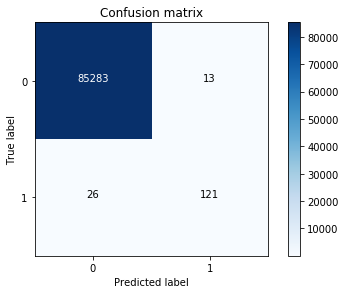

In [15]:
cnf_matrix = confusion_matrix(y_test_rf_static, pred_rf_static)
plot_confusion_matrix(cnf_matrix , classes=[0,1], title='Confusion matrix')

### Incremental learning

In [16]:
#initialize data
data_days = data.copy()
td_seconds = pd.to_timedelta(data_days['Time'], unit='s')
data_days["Time_d"] = td_seconds.dt.components.days

first_day = data_days.loc[data_days["Time_d"] == 0]
second_day = data_days.loc[data_days["Time_d"] == 1]
first_day = first_day.drop(['Time_d'], axis = 1)
second_day = second_day.drop(['Time_d'], axis = 1)

In [17]:
X1 = np.array(first_day.loc[:, first_day.columns != 'Class' ])
y1 = np.array(first_day.loc[:, first_day.columns == 'Class']).ravel()
X_train1, X_test1_rf_update, y_train1, y_test1_rf_update = train_test_split(X1, y1, test_size=0.3)

X2 = np.array(second_day.loc[:, second_day.columns != 'Class' ])
y2 = np.array(second_day.loc[:, second_day.columns == 'Class']).ravel()
X_train2, X_test2_rf_update, y_train2, y_test2_rf_update = train_test_split(X2, y2, test_size=0.3)

In [18]:
n=len(X_train1)
sm = SMOTE(sampling_strategy={1: (int)(0.4*n)})
X_train_smote1, y_train_smote1 = sm.fit_sample(X_train1, y_train1)
X_train_smote2, y_train_smote2 = sm.fit_sample(X_train2, y_train2)

In [19]:
rf_update = RandomForestClassifier(n_jobs = 2, warm_start = True, n_estimators = 50)     
rf_update.fit(X_train_smote1,y_train_smote1)
rf_update.n_estimators += 50

rf_update.fit(X_train_smote2, y_train_smote2)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=2,
            oob_score=False, random_state=None, verbose=0, warm_start=True)

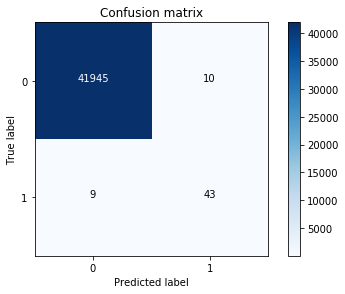

In [21]:
pred_rf_update = rf_update.predict(X_test2_rf_update)
cnf_matrix = confusion_matrix(y_test2_rf_update, pred_rf_update)
plot_confusion_matrix(cnf_matrix, classes=[0,1], title='Confusion matrix')

### 3.2. SVM

### Incremental learning 

In [29]:
# initialize data for svm
X_train1, X_test1_svm_update, y_train1, y_test1_svm_update = train_test_split(X1, y1, test_size=0.3)
X_train2, X_test2_svm_update, y_train2, y_test2_svm_update = train_test_split(X2, y2, test_size=0.3)

In [33]:
scaler = SS()
X_train1 = scaler.fit_transform(X_train1)
X_train2 = scaler.fit_transform(X_train2)

n=len(X_train1)
sm = SMOTE(sampling_strategy={1: (int)(0.4*n)})
X_train_smote1, y_train_smote1 = sm.fit_sample(X_train1, y_train1)
X_train_smote2, y_train_smote2 = sm.fit_sample(X_train2, y_train2)

In [42]:
svm_1 = SVC(kernel = 'rbf', C = 10, gamma = 0.01, probability = True) 
svm_1.fit(X_train_smote1, y_train_smote1) 

In [43]:
svm_2 = SVC(kernel = 'rbf', C = 10, gamma = 0.01, probability = True) 
svm_2.fit(X_train_smote2, y_train_smote2) 

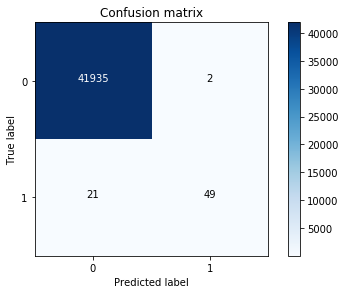

In [39]:
X_test2_svm_update = scaler.fit_transform(X_test2_svm_update)
pred_svm_update = svm_2.predict(X_test2_svm_update)
cnf_matrix = confusion_matrix(y_test2_svm_update, pred_svm_update)
plot_confusion_matrix(cnf_matrix, classes=[0,1], title='Confusion matrix')

###  Static learning

In [26]:
#initialize data
X_train, X_test_svm_static, y_train, y_test_svm_static = train_test_split(X, y, test_size=0.3, random_state=0)
X_train = scaler.fit_transform(X_train)

n=len(X_train1)
sm = SMOTE(sampling_strategy={1: (int)(0.4*n)})
X_train_smote1, y_train_smote1 = sm.fit_sample(X_train, y_train)

In [44]:
svm = SVC(kernel = 'rbf', C = 10, gamma = 0.01, probability = True)
svm.fit(X_train, y_train) 

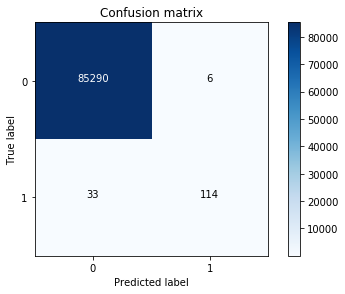

In [38]:
X_test_svm_static = scaler.fit_transform(X_test_svm_static)
pred_svm_static = svm.predict(X_test_svm_static)
cnf_matrix = confusion_matrix(y_test_svm_static, pred_svm_static)
plot_confusion_matrix(cnf_matrix, classes=[0,1], title='Confusion matrix')

### 3.3. Logistic Regression 

### Static learning

In [28]:
#initialize data
X_train, X_test_lr_static, y_train, y_test_lr_static = train_test_split(X, y, test_size=0.3, random_state=0)

n=len(X_train)
sm = SMOTE(sampling_strategy={1: (int)(0.4*n)})
X_train_smote, y_train_smote = sm.fit_sample(X_train, y_train)

In [29]:
lr = LR(C=100, max_iter=500, solver = 'lbfgs') 
lr.fit(X_train_smote, y_train_smote)

LogisticRegression(C=100, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=500, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='lbfgs',
          tol=0.0001, verbose=0, warm_start=False)

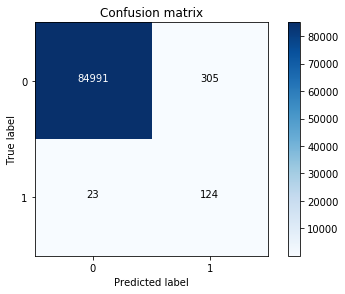

In [30]:
pred_lr_static = lr.predict(X_test_lr_static)
cnf_matrix = confusion_matrix(y_test_lr_static, pred_lr_static)
plot_confusion_matrix(cnf_matrix, classes=[0,1], title='Confusion matrix')

### Incremental learning

In [31]:
# initialize data
X_train1, X_test1_lr_update, y_train1, y_test1_lr_update = train_test_split(X1, y1, test_size=0.3)
X_train2, X_test2_lr_update, y_train2, y_test2_lr_update = train_test_split(X2, y2, test_size=0.3)

n=len(X_train1)
sm = SMOTE(sampling_strategy={1: (int)(0.4*n)})
X_train_smote1, y_train_smote1 = sm.fit_sample(X_train1, y_train1)
X_train_smote2, y_train_smote2 = sm.fit_sample(X_train2, y_train2)

In [32]:
lr_1 = LR(C=100, max_iter=500, solver = 'lbfgs') 
lr_1.fit(X_train_smote1, y_train_smote1)

LogisticRegression(C=100, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=500, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='lbfgs',
          tol=0.0001, verbose=0, warm_start=False)

In [33]:
lr_2 = LR(C=100, max_iter=500, solver = 'lbfgs') 
lr_2.fit(X_train_smote2, y_train_smote2)

LogisticRegression(C=100, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=500, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='lbfgs',
          tol=0.0001, verbose=0, warm_start=False)

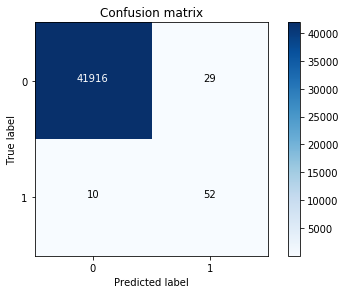

In [36]:
pred_lr_update = lr_1.predict(X_test2_lr_update)
cnf_matrix = confusion_matrix(y_test2_lr_update, pred_lr_update)
plot_confusion_matrix(cnf_matrix, classes=[0,1], title='Confusion matrix')

## 4. Evaluation

The results are evaluated by two measures, area under the ROC curve (AUC) and average precision (AP).  ROC curve is plotted as Recall (TPR) against Fall-out (FPR) at various classification thresholds. Transaction with fraud probability that equals or is above threshold value is considered fraudulent. The best classifier corresponds to the point (0,1) where there are no false positives or false negatives. AUC metric measures how much is the ROC curve of single classifier close to the optimal point. 
Second measure, average precision, approximates area under the precision-recall curve. A precision-recall curve is a plot of precision versus recall at different probability thresholds. Intuitively, each threshold represents rank and we want to examine how specific model performs for highest ranked transactions. Average precision is calculated as mean precision averaging over recall values.

0.9114884206355587
0.913342363154662
0.919980815905428
0.9190091479241249
0.8877199304032249
0.8499761547082528


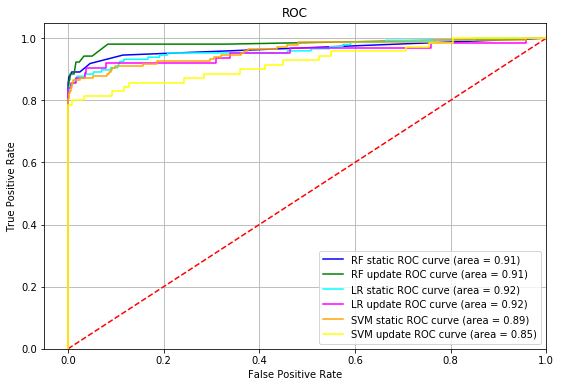

In [40]:
classifiers = [rf, rf_update, lr, lr_1 , svm, svm_2 ]
names_clf = ['RF static', 'RF update', 'LR static', 'LR update', 'SVM static','SVM update'] 
colors = ['blue', 'green', 'cyan', 'magenta', 'orange', 'yellow']

plt.figure(figsize=(9, 6))
plt.title('ROC')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.xlim([-0.05, 1])
plt.ylim([0, 1.05])
plt.plot([0, 1], [0, 1],'r--')

dataTestX = [X_test_rf_static, X_test2_rf_update,  X_test_lr_static, X_test2_lr_update, X_test_svm_static, X_test2_svm_update] 
dataTestY = [y_test_rf_static, y_test2_rf_update, y_test_lr_static, y_test2_lr_update, y_test_svm_static,  y_test2_svm_update]  
predi = [pred_rf_static, pred_rf_update, pred_lr_static, pred_lr_update, pred_svm_static, pred_svm_update] 

for i in range (len(classifiers)):
    probs = classifiers[i].predict_proba(dataTestX[i])[:,1]
    fpr, tpr, threshold = roc_curve(dataTestY[i], probs)
    roc_auc = roc_auc_score(dataTestY[i], predi[i])
    print(roc_auc)
    plt.plot(fpr, tpr, color = colors[i], label = '%s ROC curve (area = %0.2f)' % (names_clf[i], roc_auc))

plt.legend(loc = 'lower right')
plt.grid()
plt.show()

0.8518109493394408
0.8252971731361756
0.7152939269080745
0.8297985040948006
0.7978050419980774
0.7818746641247653


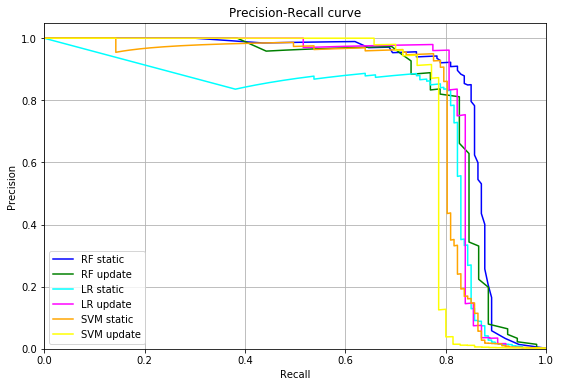

In [41]:
plt.figure(figsize=(9,6))
plt.title('Precision-Recall curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])

for i in range (len(classifiers)):
    probs = classifiers[i].predict_proba(dataTestX[i])[:,1]
    ap_ = ap(dataTestY[i], probs)
    print(ap_)
    precision, recall, _ = precision_recall_curve(dataTestY[i], probs)          
    plt.plot(recall, precision, color=colors[i], label = '%s'%(names_clf[i]))

plt.legend(loc = 'lower left')
plt.grid()
plt.show()

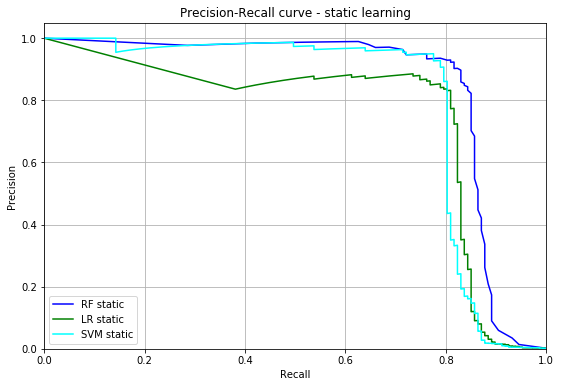

In [65]:
classifiers = [rf, lr, svm]
names_clf = ['RF static', 'LR static', 'SVM static'] 
classifiers_2 = [rf_update, lr_1 , svm_2 ]
names_clf_2 = ['RF update',  'LR update','SVM update'] 
colors = ['blue', 'green', 'cyan']

dataTestX = [X_test_rf_static,  X_test_lr_static, X_test_svm_static] 
dataTestY = [y_test_rf_static,  y_test_lr_static,  y_test_svm_static]  
predi = [pred_rf_static, pred_lr_static, pred_svm_static] 

dataTestX_2 = [ X_test2_rf_update,   X_test2_lr_update, X_test2_svm_update] 
dataTestY_2 = [y_test2_rf_update, y_test2_lr_update, y_test2_svm_update]  
predi_2 = [ pred_rf_update,  pred_lr_update,  pred_svm_update] 

plt.figure(figsize=(9,6))
plt.title('Precision-Recall curve - static learning')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])

for i in range (len(classifiers)):
    probs = classifiers[i].predict_proba(dataTestX[i])[:,1]
    ap_ = ap(dataTestY[i], probs)
    precision, recall, _ = precision_recall_curve(dataTestY[i], probs)          
    plt.plot(recall, precision, color=colors[i], label = '%s'%(names_clf[i]))

plt.legend(loc = 'lower left')
plt.grid()
plt.savefig("ap static")
plt.show()

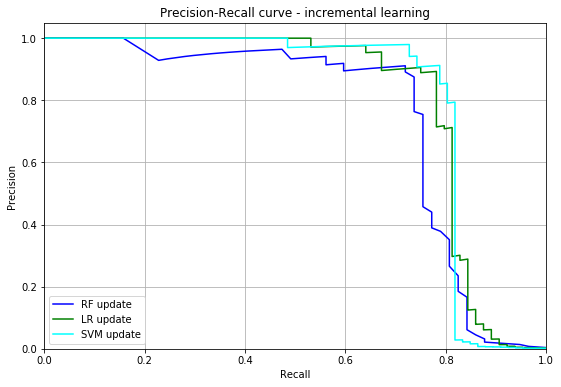

In [66]:
plt.figure(figsize=(9,6))
plt.title('Precision-Recall curve - incremental learning')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])

for i in range (len(classifiers)):
    probs = classifiers_2[i].predict_proba(dataTestX_2[i])[:,1]
    ap_ = ap(dataTestY_2[i], probs)
    precision, recall, _ = precision_recall_curve(dataTestY_2[i], probs)          
    plt.plot(recall, precision, color=colors[i], label = '%s'%(names_clf_2[i]))

plt.legend(loc = 'lower left')
plt.grid()
plt.savefig("ap update")
plt.show()